In [22]:
#Load Libraries

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline


In [2]:
#STEP 1: DATA UPLOAD
#Load DataSet

diabetes = pd.read_csv('../data_cleaningML/diabetes.csv')

In [3]:
#STEP 2: CLEANING AND PREPROCESSING

#Load the first 5 rows
diabetes.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [5]:
#Check our column(FEATURES)to check if its object(str: categorica) or numbers(int: numeric)
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [6]:
#Check the total number of rows and columns in the dataset
diabetes.shape

(768, 9)

In [23]:
#Check for duplicates
diabetes.duplicated().sum()

0

In [24]:
#Check percentage of missing values in the dataset
diabetes.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [8]:
from ydata_profiling import ProfileReport

In [9]:
diabetes.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 9/9 [00:00<00:00, 2418.71it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

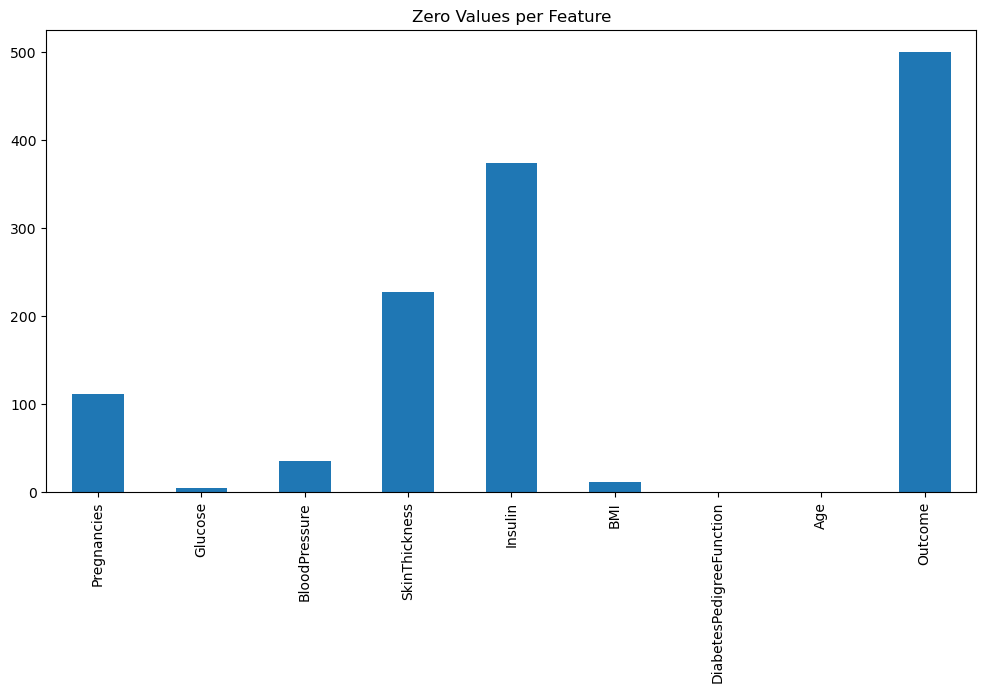

In [33]:
#STEP 3: EXPLORATORY DATA ANALYSIS

#Zero value check plot: To count zero values per feature in each column
zero_counts = (diabetes == 0).sum()
zero_counts.plot(kind='bar', figsize=(12, 6))
plt.title("Zero Values per Feature")
plt.show()


<Figure size 640x480 with 0 Axes>

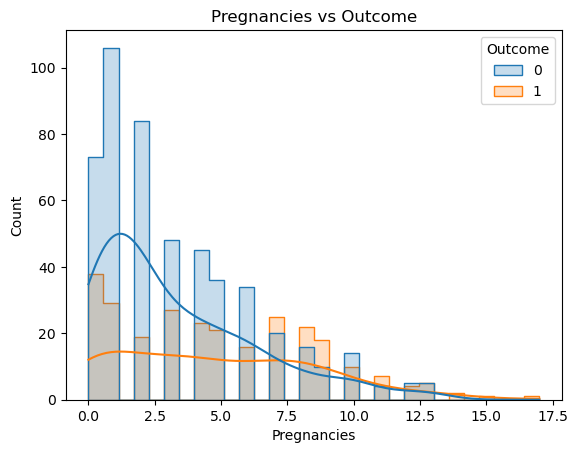

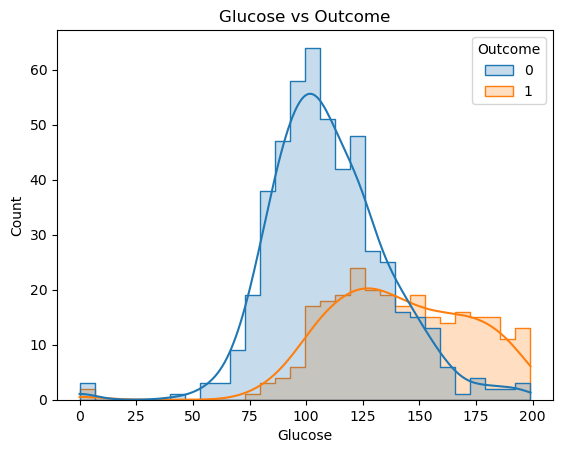

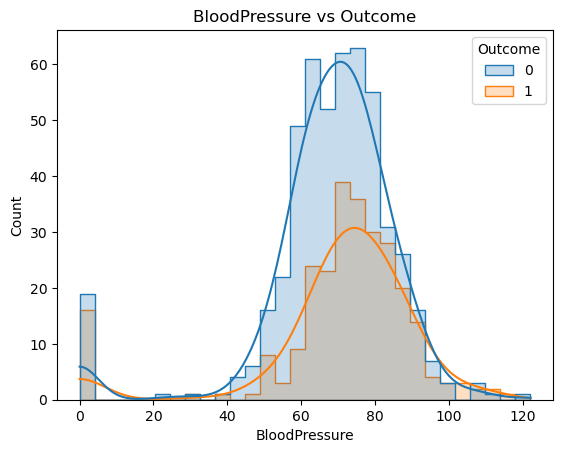

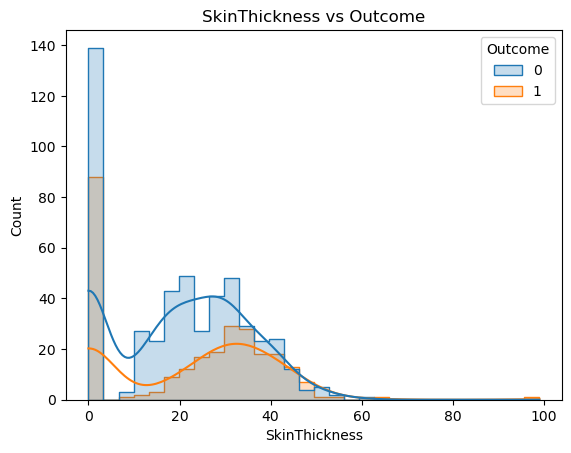

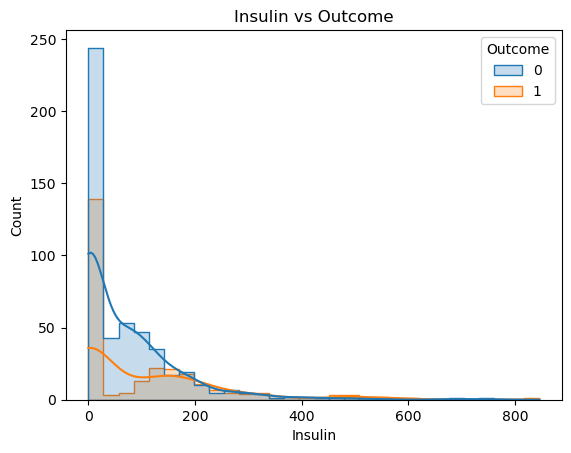

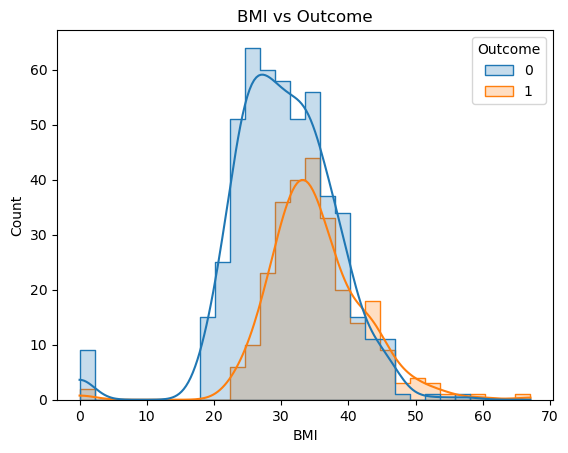

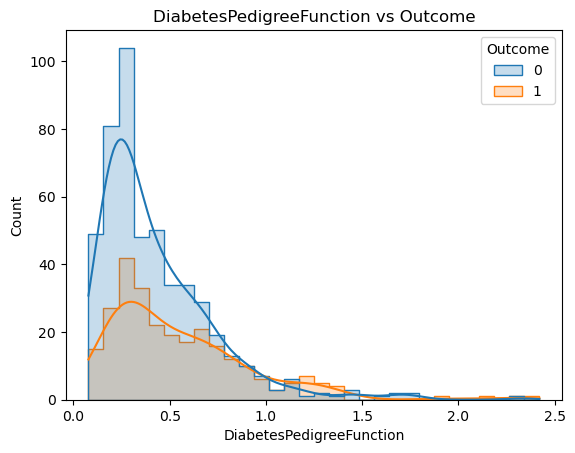

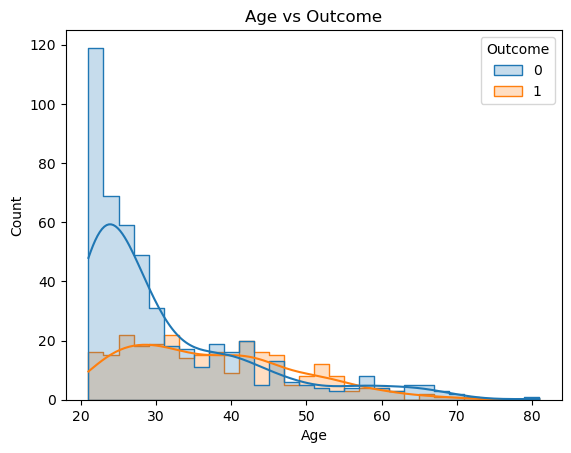

In [20]:
#Histogram: To visualize the distribution of the features against the Outcome

features = ["Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI", "DiabetesPedigreeFunction", "Age"]

for col in features:
    plt.figure()
    sns.histplot(
        data=diabetes,
        x=col,
        hue="Outcome",
        bins=30, 
        kde=True,
        element="step"
    )
    plt.title(f'{col} vs Outcome')
    plt.show()


In [10]:
#TO CHECK THE CORRELATION BETWEEN THE VARIABLES
diabetes.corr()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341,0.221898
Glucose,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514,0.466581
BloodPressure,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528,0.065068
SkinThickness,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970,0.074752
Insulin,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163,0.130548
BMI,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242,0.292695
DiabetesPedigreeFunction,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561,0.173844
Age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000,0.238356
Outcome,0.221898,0.466581,0.065068,0.074752,0.130548,0.292695,0.173844,0.238356,1.000000


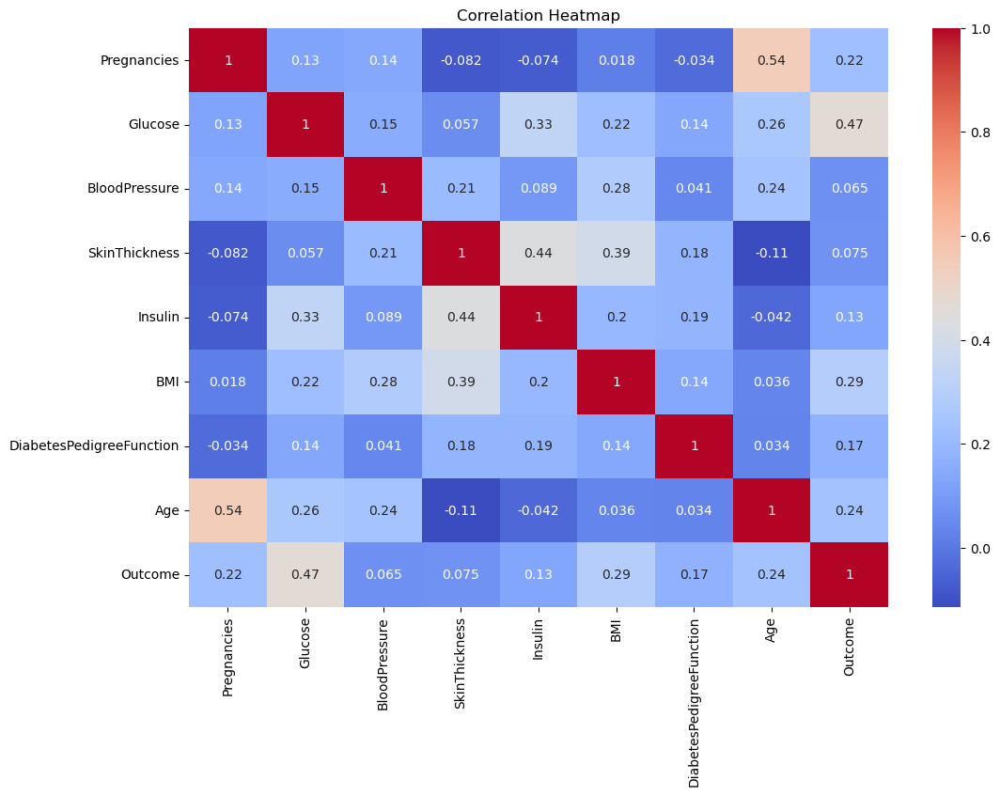

In [13]:
plt.figure(figsize=(12, 8))
sns.heatmap(diabetes.corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()


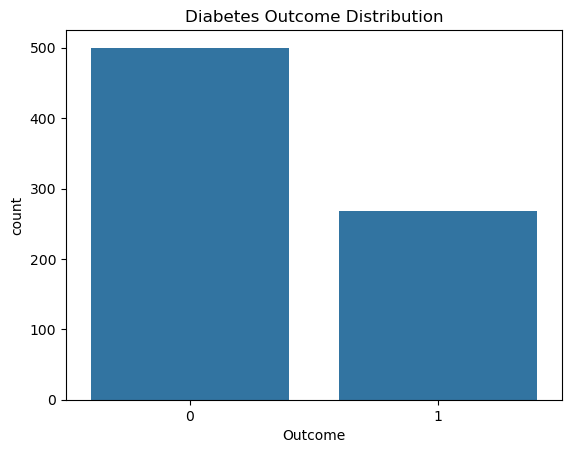

In [21]:
#COUNT DIABETES OUTCOME DISTRIBUTION 

sns.countplot(x='Outcome', data=diabetes)
plt.title("Diabetes Outcome Distribution")
plt.show()


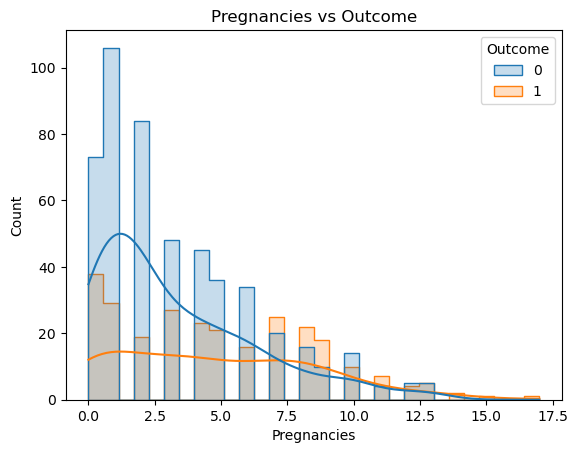

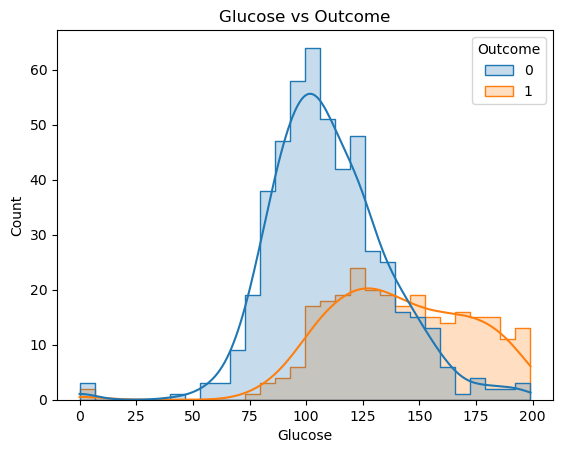

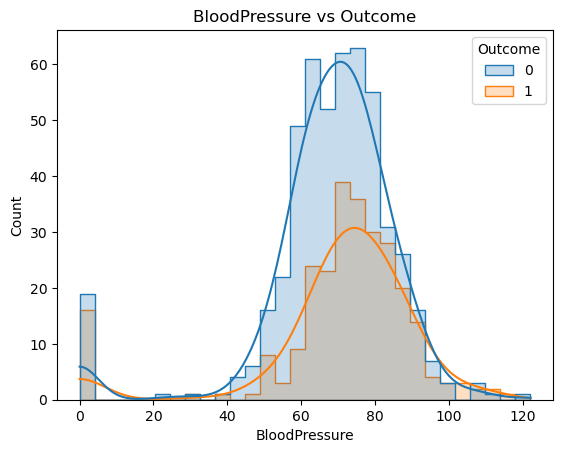

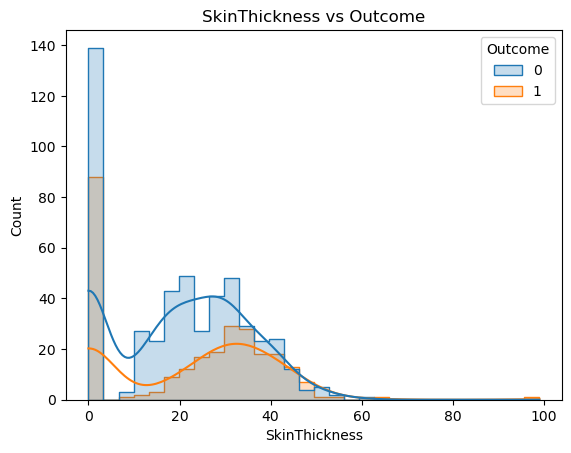

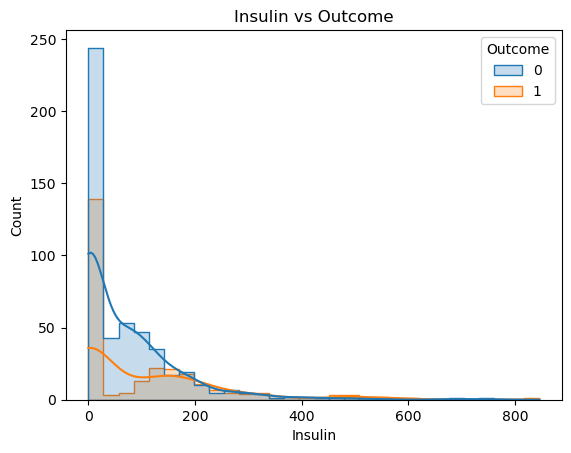

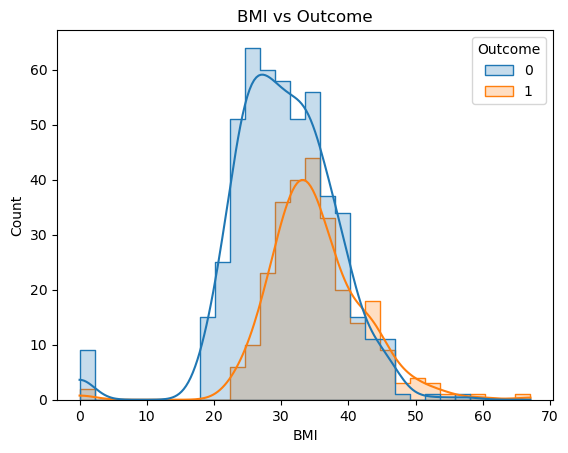

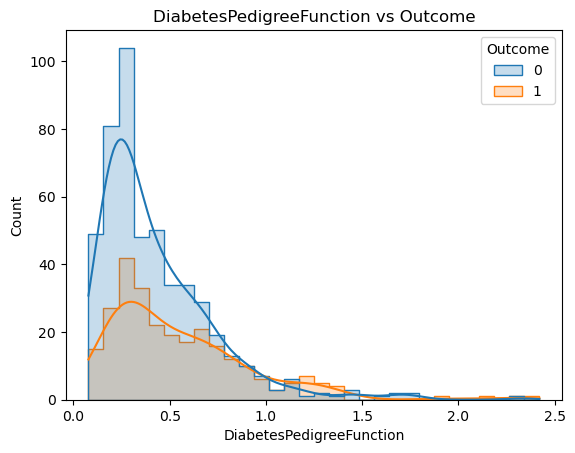

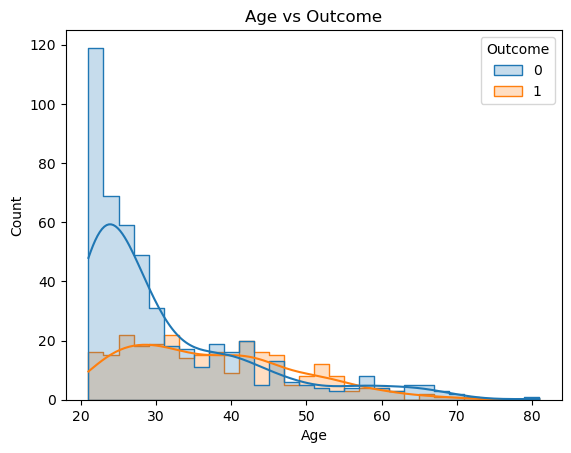

In [34]:
#Histogram: To visualize the distribution of the features against the Outcome

features = ["Pregnancies", "Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI", "DiabetesPedigreeFunction", "Age"]

for col in features:
    plt.figure()
    sns.histplot(
        data=diabetes,
        x=col,
        hue="Outcome",
        bins=30, 
        kde=True,
        element="step"
    )
    plt.title(f'{col} vs Outcome')
    plt.show()


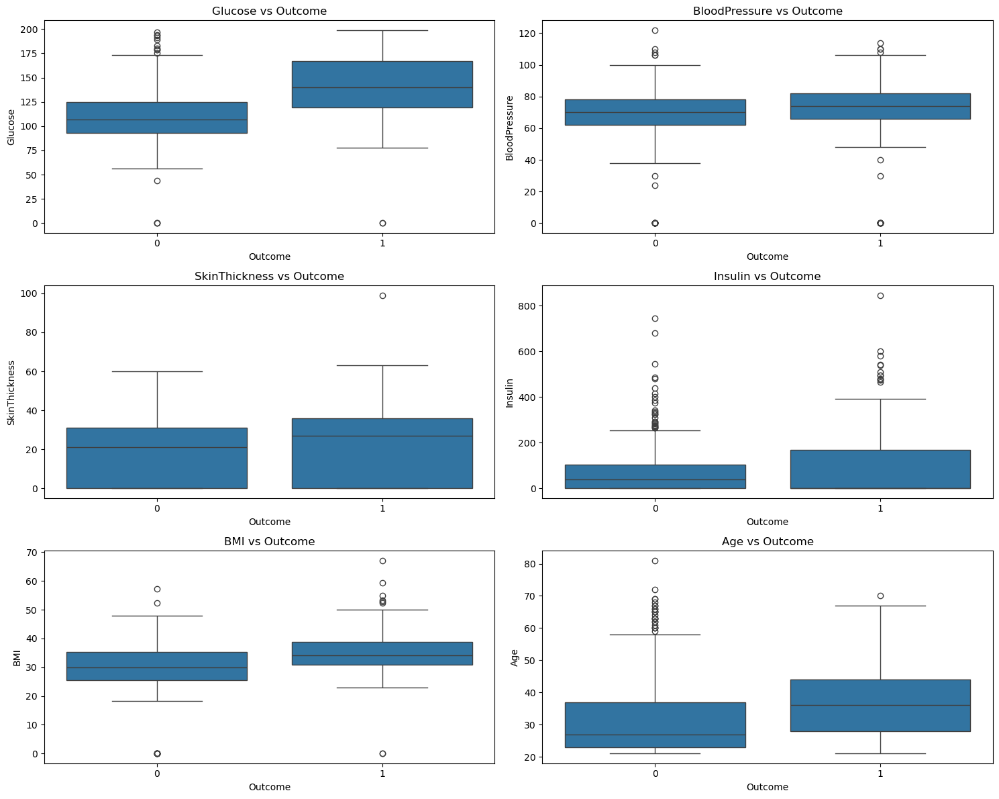

In [28]:
#Box plots grouped by Outcome to detect ouliers

features = ['Glucose','BloodPressure','SkinThickness','Insulin','BMI','Age']

plt.figure(figsize=(15, 12))
for i, col in enumerate(features, 1):
    plt.subplot(3, 2, i)
    sns.boxplot(x='Outcome', y=col, data=diabetes)
    plt.title(f"{col} vs Outcome")
plt.tight_layout()
plt.show()


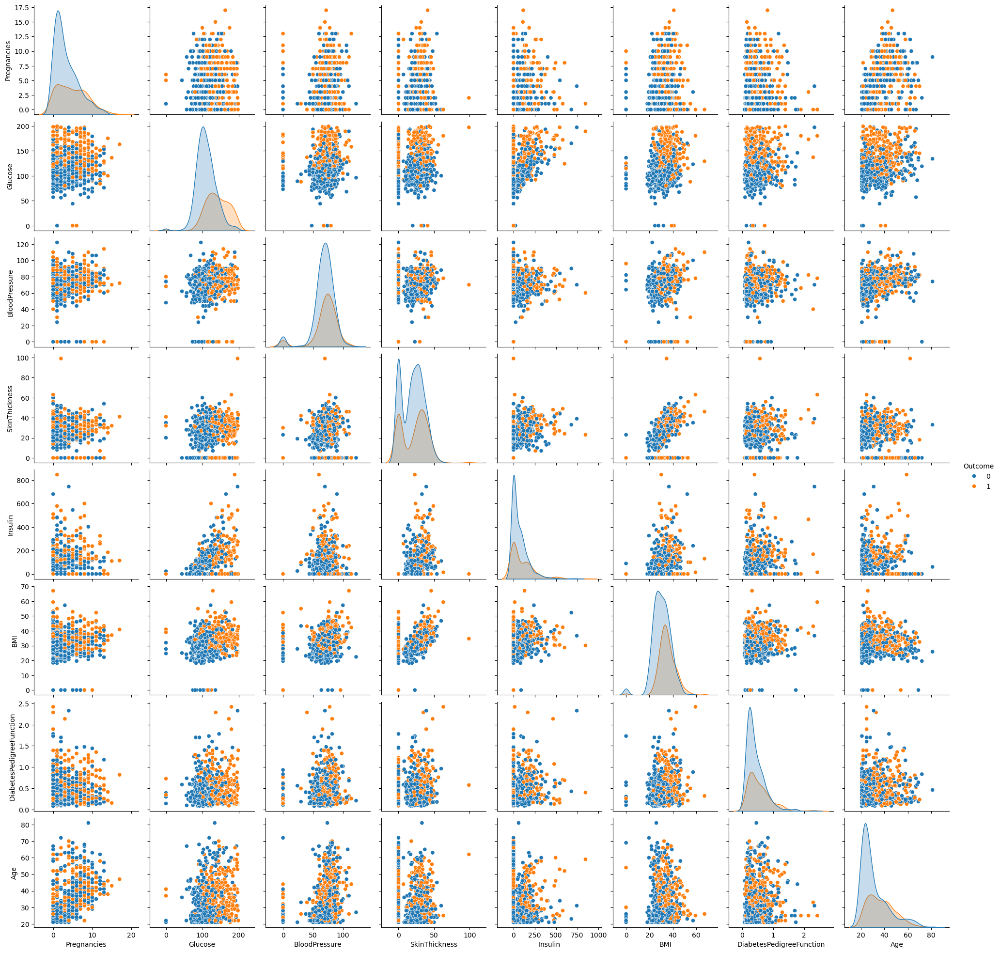

In [31]:
#A comprehensive visual summary of the relationshp between the all Features and Outcome
sns.pairplot(diabetes, hue='Outcome')
plt.show()
